In [1]:
#导入常用的库
import pandas as pd 
import matplotlib.pyplot as plt
pd.options.display.max_columns = None #显示完整打印数据
pd.options.display.max_rows = None
plt.rcParams['figure.dpi'] = 800 
import numpy as np
import warnings
warnings.filterwarnings("ignore") # 忽略警告

In [2]:
# 读取数据
data = pd.read_excel('re.xlsx')
# 查看数据前5行
data.head()

,label,IWGE,CPE,SWT,TPV,GCA
0,256.00,-0.69712,-0.21850,-0.49543,-0.09604,-0.42218
1,159.00,-0.49629,-0.66967,-0.92778,0.03518,-0.46802
2,186.00,-0.09370,-0.50640,-1.23800,-0.90647,-0.35828
3,93.50,-0.74211,-0.66659,-0.56631,0.07388,-0.02958
4,331.43,-0.53269,-0.61868,0.54067,-0.34452,0.62639


In [3]:
# 查看数据形状
data.shape

(167, 6)

In [4]:
# 查看数据类型分布
data.dtypes

label    float64
IWGE     float64
CPE      float64
SWT      float64
TPV      float64
GCA      float64
dtype: object

In [5]:
# 数据描述
data.describe()

,label,IWGE,CPE,SWT,TPV,GCA
count,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000
mean,1464.227804,-0.128600,0.018684,-0.018302,-0.000330,0.009804
std,3627.372917,0.878388,0.985101,0.964314,1.108721,1.000542
min,19.800000,-1.623420,-1.527820,-2.876910,-2.341910,-1.366330
25%,214.425000,-0.680180,-0.618680,-0.564035,-0.514520,-0.371915
50%,489.820000,-0.348350,-0.248590,0.086650,-0.185950,-0.036950
75%,1208.535672,0.130765,0.438710,0.695860,0.217490,0.217370
max,36080.000000,3.809280,5.448290,2.219320,5.773220,10.880440


In [6]:
# 检查每列缺失值个数
data.isnull().sum()

label    0
IWGE     0
CPE      0
SWT      0
TPV      0
GCA      0
dtype: int64

Text(0.5, 1.0, 'Check for missing data')

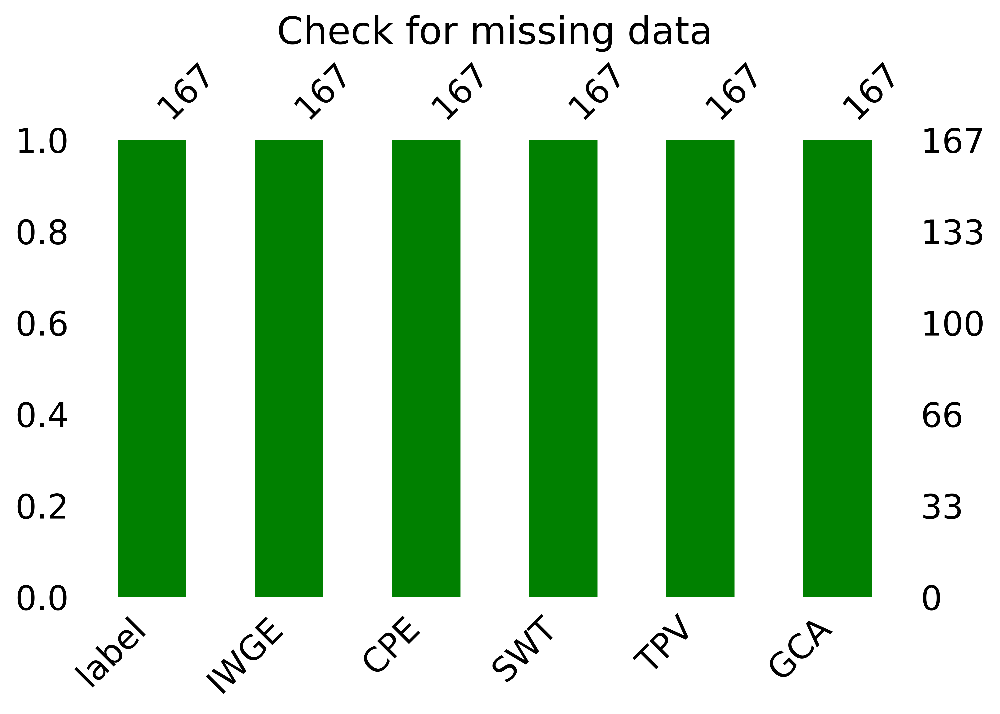

In [7]:
# 可视化数据缺失情况
import missingno as msno
plt.figure()
p=msno.bar(data,color='g',figsize=(7, 4))
plt.title('Check for missing data',fontsize=18)

Text(0.5, 1.0, 'Correlation Heatmaps')

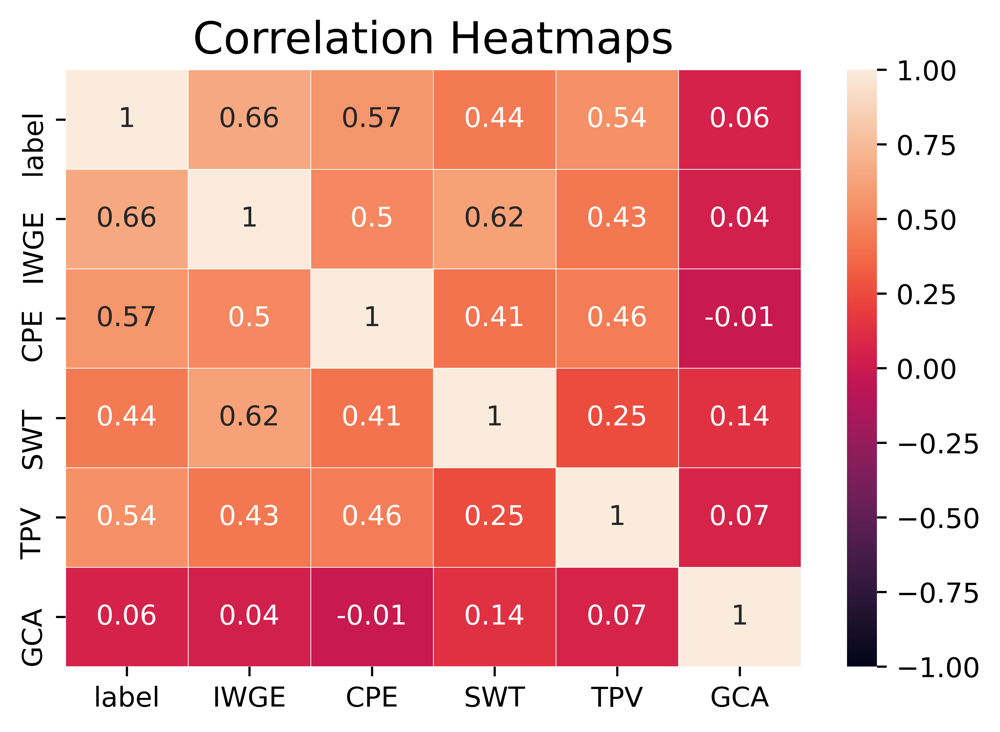

In [8]:
# 画热力图，观察两个变量之间的相关系数，大小在-1到1之间
plt.figure(figsize=(6,4))
import seaborn as sns
cov = data.corr().round(2)
sns.heatmap(cov,annot=True,linewidths=0.1,vmax=1,vmin=-1)
plt.title('Correlation Heatmaps',size=16)

In [9]:
# 分离建模变量和标签
x = data.drop(['label'],axis=1)
y = data['label']

In [10]:
# 随机划分训练集和测试集,8:2
from sklearn import model_selection
x_train, x_test, y_train, y_test = model_selection.train_test_split(x,y,test_size=0.2,random_state=2022)

In [11]:
# 定义评价指标
from sklearn.metrics import mean_squared_error 
from sklearn.metrics import mean_absolute_error 
from sklearn import metrics
def try_different_method(model):  
    model.fit(x_train,y_train)
    y_predict = model.predict(x_test) 
   
    print('RMSE值为:',np.sqrt(metrics.mean_squared_error(y_test, y_predict)))
    print('MAE值为:',mean_absolute_error(y_test,y_predict))
    print('R方值为:', metrics.r2_score(y_test, y_predict))

In [12]:
# 模型建立
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb




model_KNN = KNeighborsRegressor(n_neighbors=5)
model_RF = RandomForestRegressor(random_state=2022,
                                         n_estimators=50,
                                            max_depth=2)
model_XGB = xgb.XGBRegressor(max_depth=4,
                             learning_rate=0.3, 
                            n_estimators=50,
                            random_state=2022)

In [13]:
# 输出测试集评价指标
print('KNN模型评分如下：')
try_different_method(model_KNN)
print('随机森林模型评分如下：')
try_different_method(model_RF)
print('XGboost模型评分如下：')
try_different_method(model_XGB)

KNN模型评分如下：
RMSE值为: 763.5644146180321
MAE值为: 319.85969424682344
R方值为: 0.49910487020901084
随机森林模型评分如下：
RMSE值为: 751.0703223630632
MAE值为: 446.7041142185848
R方值为: 0.5153629057970057
XGboost模型评分如下：
RMSE值为: 682.4890106521609
MAE值为: 295.19239761273485
R方值为: 0.5998279295402036


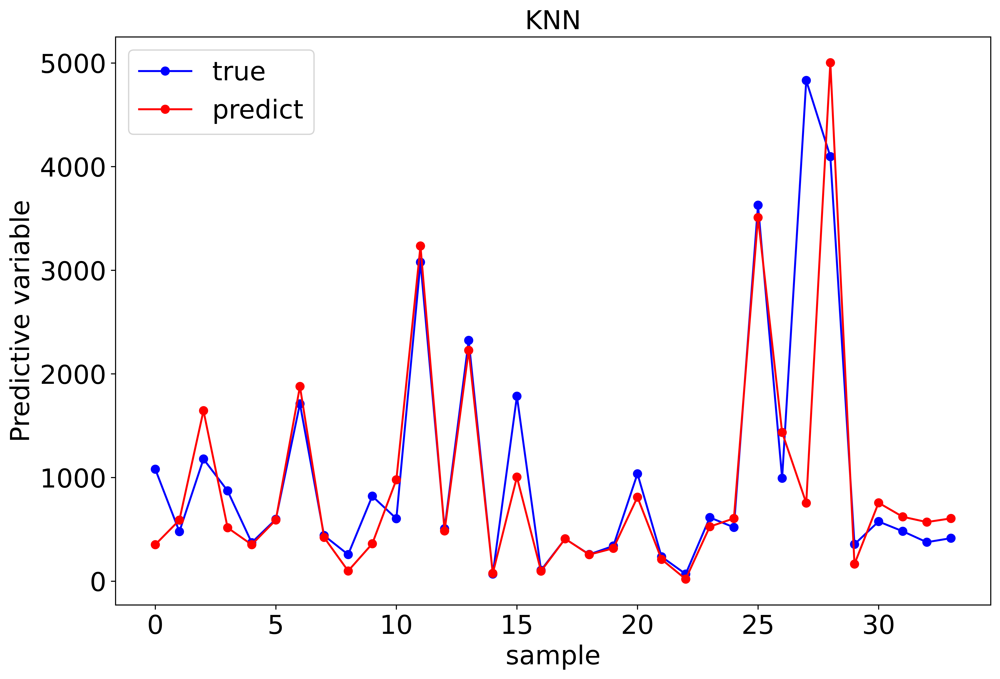

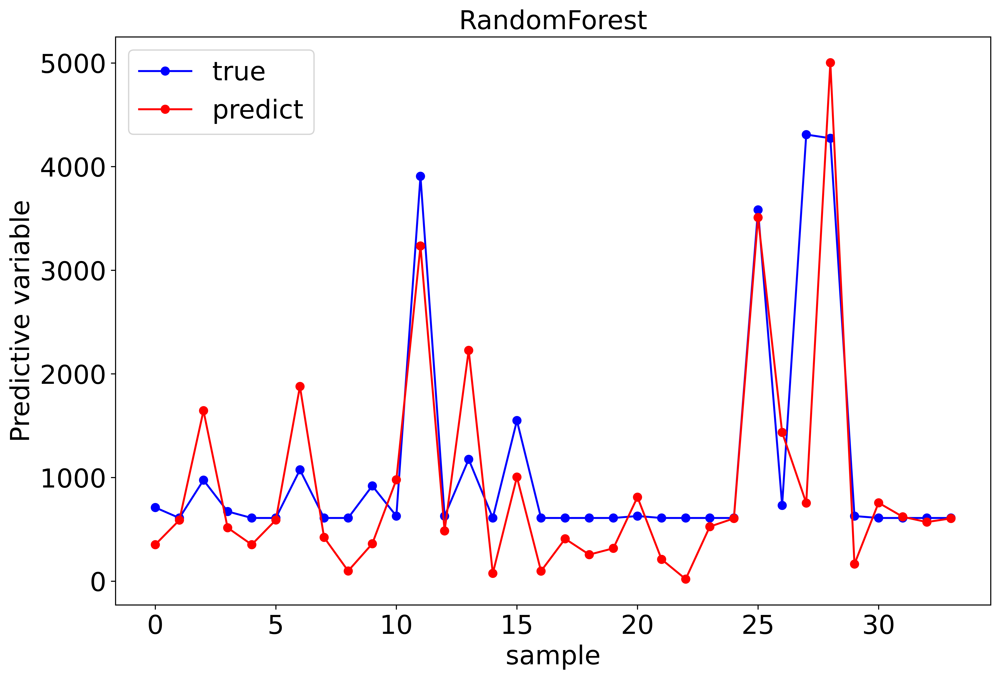

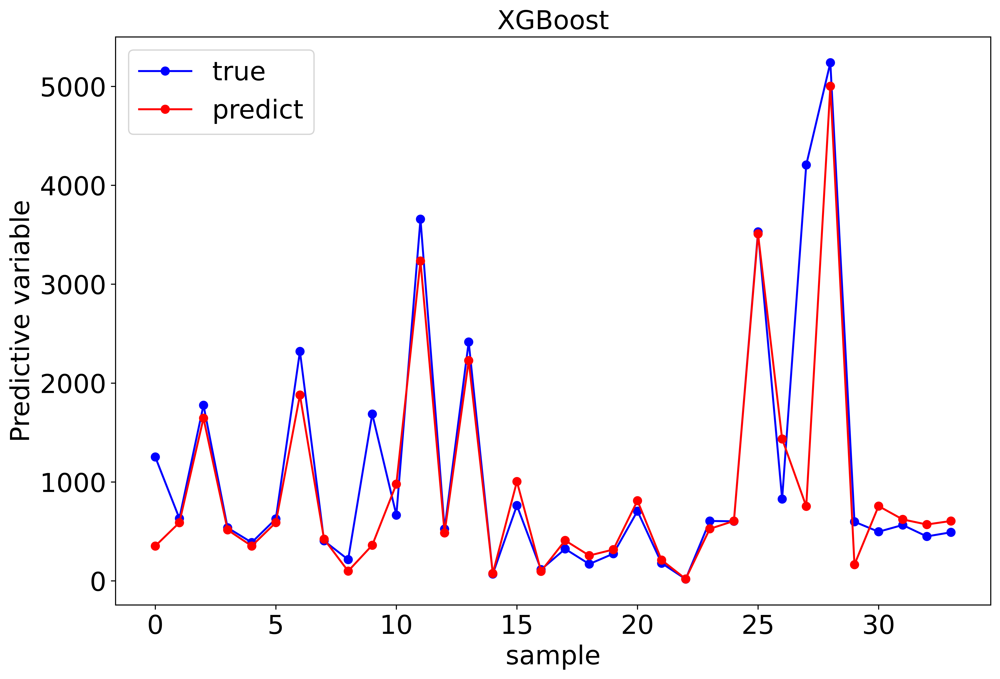

In [14]:
# 真实值与预测值可视化
# KNN
import matplotlib.pyplot as plt
y_test = y_test.reset_index(drop = True)
y_predict1 = model_KNN.predict(x_test)
plt.figure(figsize = (12,8))
plt.plot(y_predict1,color = 'b',marker='o',label = 'true')
plt.plot(y_test,color = 'r',marker='o',label = 'predict')
plt.xlabel('sample',fontsize=20)
plt.ylabel('Predictive variable',fontsize=20)
plt.title('KNN',fontsize=20)
#坐标轴字体大小
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)





# 随机森林
y_predict2 = model_RF.predict(x_test)
plt.figure(figsize = (12,8))
plt.plot(y_predict2,color = 'b',marker='o',label = 'true')
plt.plot(y_test,color = 'r',marker='o',label = 'predict')
plt.xlabel('sample',fontsize=20)
plt.ylabel('Predictive variable',fontsize=20)
plt.title('RandomForest',fontsize=20)
#坐标轴字体大小
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)




# XGboost
y_predict3 = model_XGB.predict(x_test)
plt.figure(figsize = (12,8))
plt.plot(y_predict3,color = 'b',marker='o',label = 'true')
plt.plot(y_test,color = 'r',marker='o',label = 'predict')
plt.xlabel('sample',fontsize=20)
plt.ylabel('Predictive variable',fontsize=20)
plt.title('XGBoost',fontsize=20)
#坐标轴字体大小
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

In [15]:
# XGboost网格搜索超参数调优，五折交叉验证
from sklearn.model_selection import GridSearchCV
estimator = xgb.XGBRFRegressor(random_state=2022)
param_grid = { 
               'n_estimators': [50,100,150],
               'max_depth':  [4,5,6],
               'learning_rate' : [0.1,0.15,0.2]
              }
grid = GridSearchCV(estimator, param_grid,cv=5)
grid.fit(x_train, y_train)
print('Best parameters found by grid search are:', grid.best_params_)

Best parameters found by grid search are: {'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 50}


In [16]:
# 按照网格搜索调参获得的最佳参数设置
model = xgb.XGBRegressor(random_state=2022,
                         n_estimators=50,
                         max_depth=6,
                         learning_rate=0.2)

In [17]:
# 输出评价指标
print('网格搜索调参后的XGboost模型评分如下：')
try_different_method(model)

网格搜索调参后的XGboost模型评分如下：
RMSE值为: 646.7029949103023
MAE值为: 285.8164712189338
R方值为: 0.6406934013904844


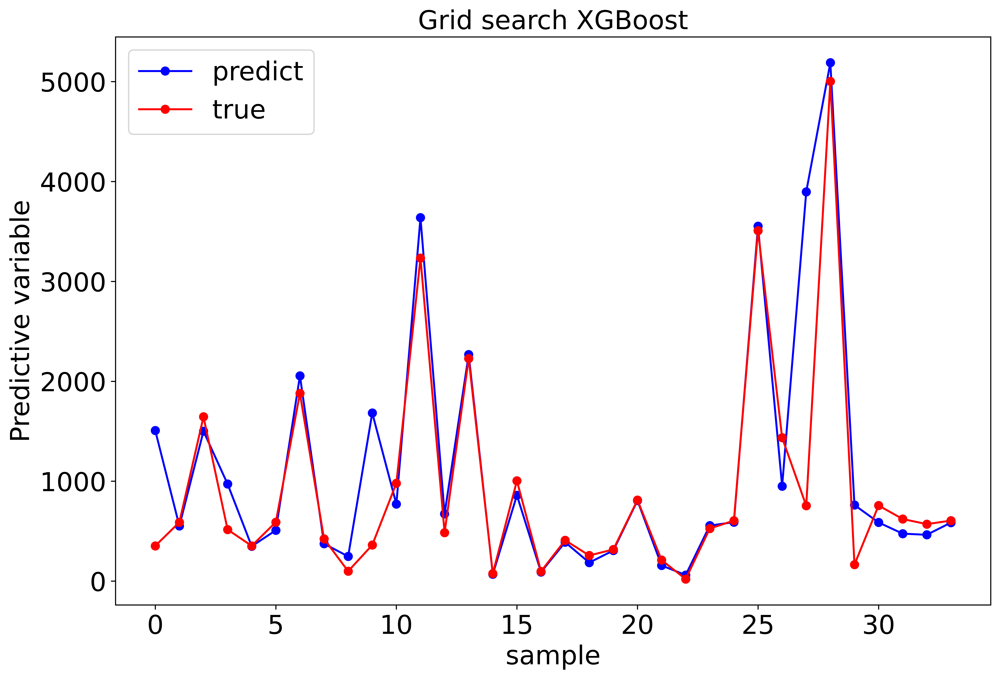

In [18]:
# 调参后XGB预测结果可视化
y_predict7 = model.predict(x_test)
plt.figure(figsize = (12,8))
plt.plot(y_predict7,color = 'b',marker='o',label = 'predict')
plt.plot(y_test,color = 'r',marker='o',label = 'true')
plt.xlabel('sample',fontsize=20)
plt.ylabel('Predictive variable',fontsize=20)
plt.title('Grid search XGBoost',fontsize=20)
#坐标轴字体大小
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

# XGboost-SHAP

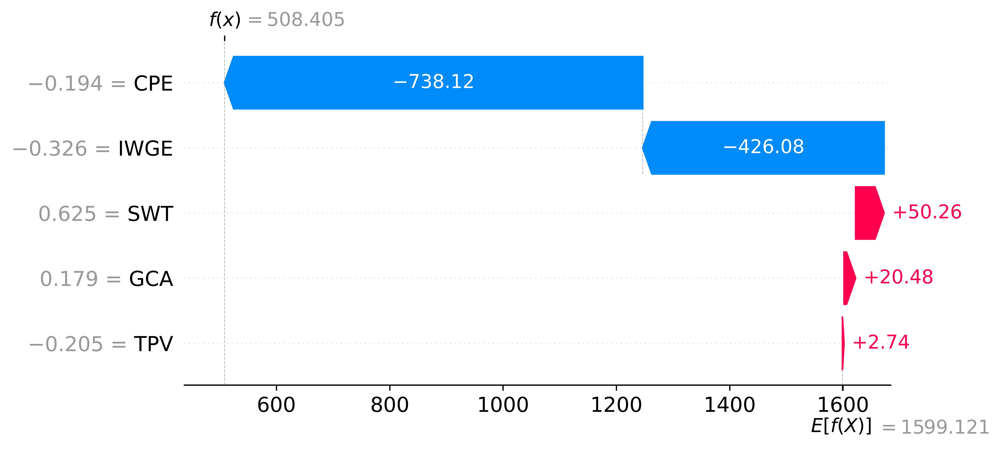

In [19]:
# 瀑布图
import shap
shap.initjs()
explainer = shap.Explainer(model)
shap_values = explainer(x_test)
shap.plots.waterfall(shap_values[5]) # 测试集第6个样本

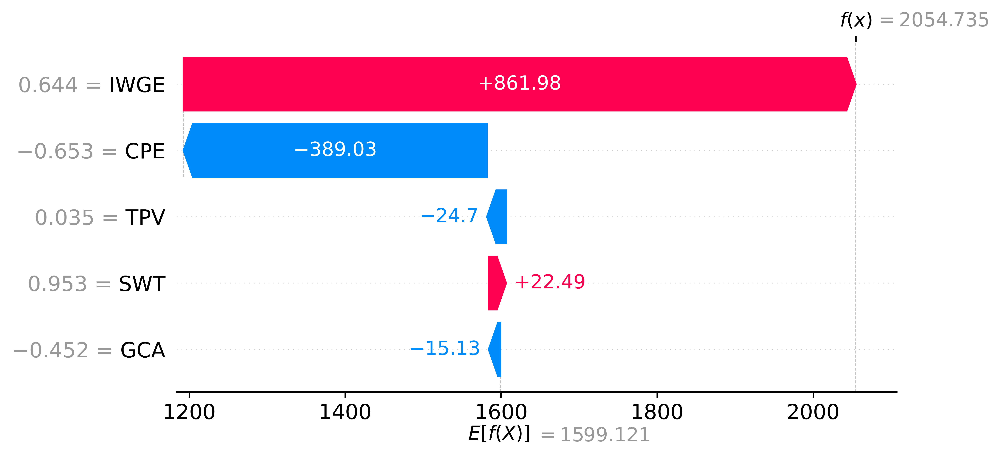

In [20]:
shap.plots.waterfall(shap_values[6]) # 测试集第7个样本

In [21]:
# 力图
shap.plots.force(shap_values[5])# 测试集第6个样本

In [22]:
# 力图
shap.plots.force(shap_values[1])# 测试集第7个样本

In [23]:
# 力图
shap.plots.force(shap_values[6])# 测试集第7个样本

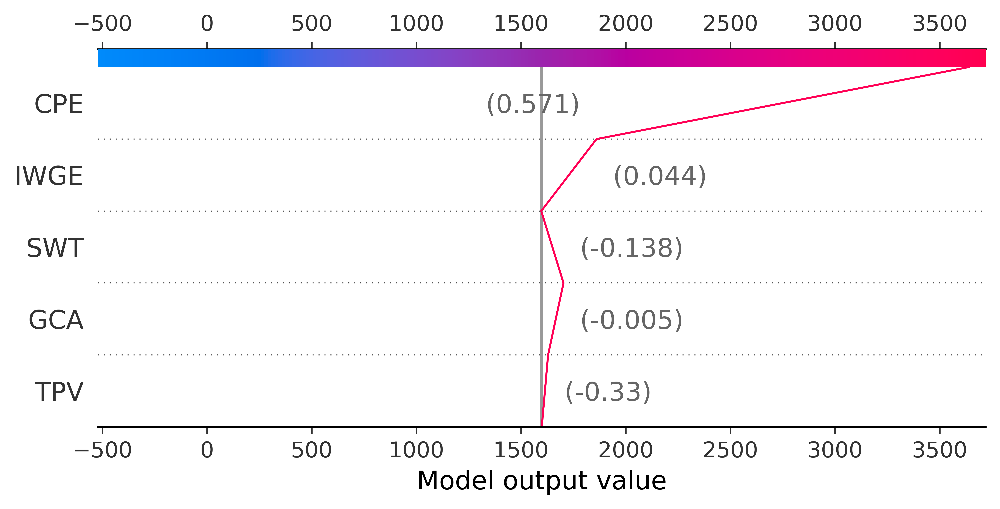

In [24]:
# 决策图
shap_values1 = explainer.shap_values(x_test)[11]
shap.decision_plot(explainer.expected_value, shap_values1, x_test, show = False)# 测试集第11个样本

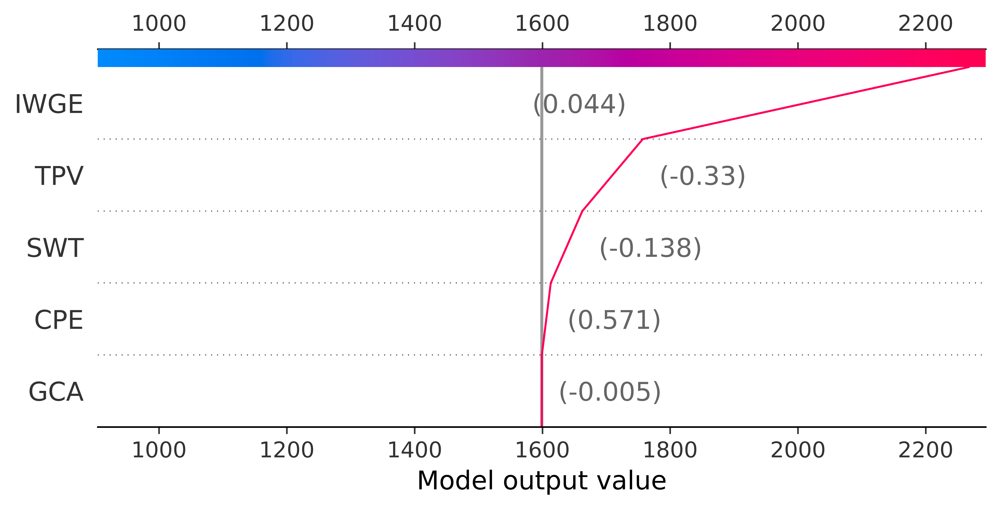

In [25]:
# 决策图
shap_values1 = explainer.shap_values(x_test)[13]
shap.decision_plot(explainer.expected_value, shap_values1, x_test, show = False)# 测试集第13个样本

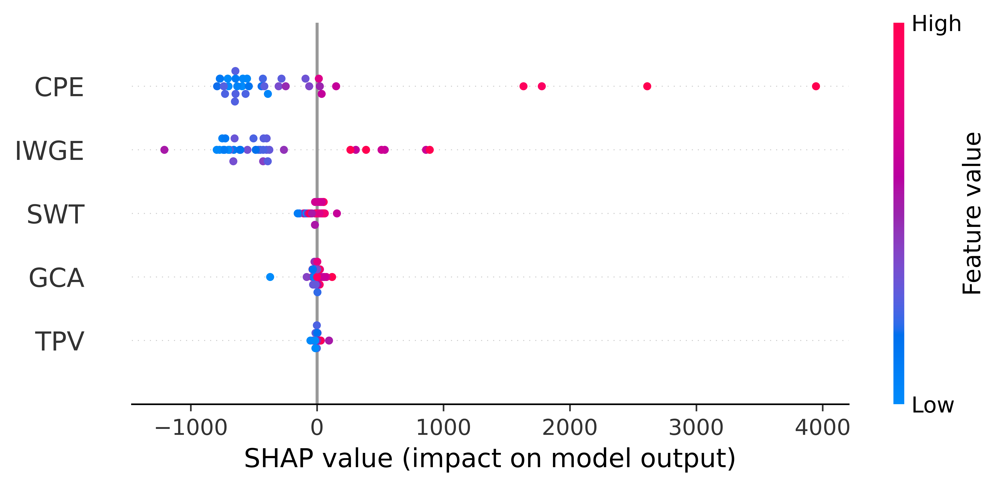

In [26]:
# [宏观]特征密度散点图：beeswarm
shap.plots.beeswarm(shap_values)

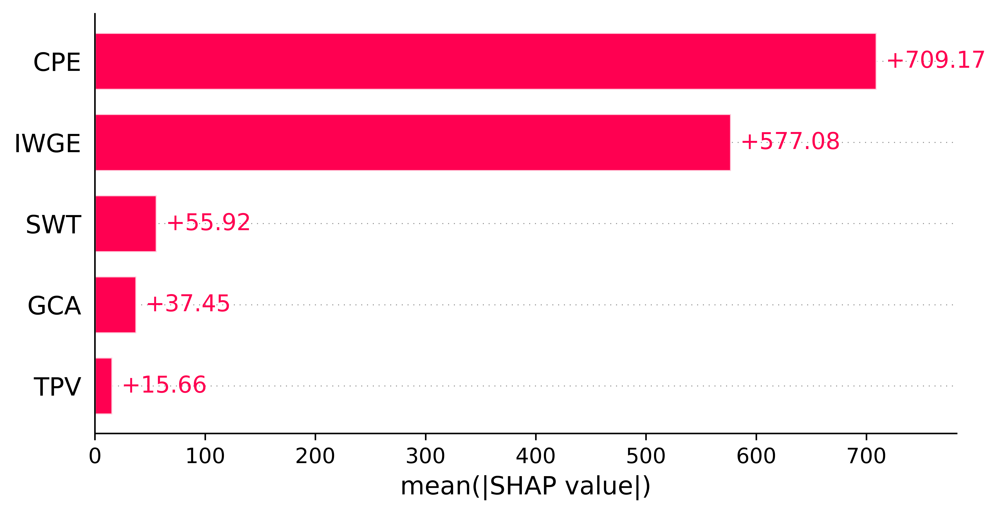

In [27]:
# [宏观]特征重要性SHAP值
shap.plots.bar(shap_values)

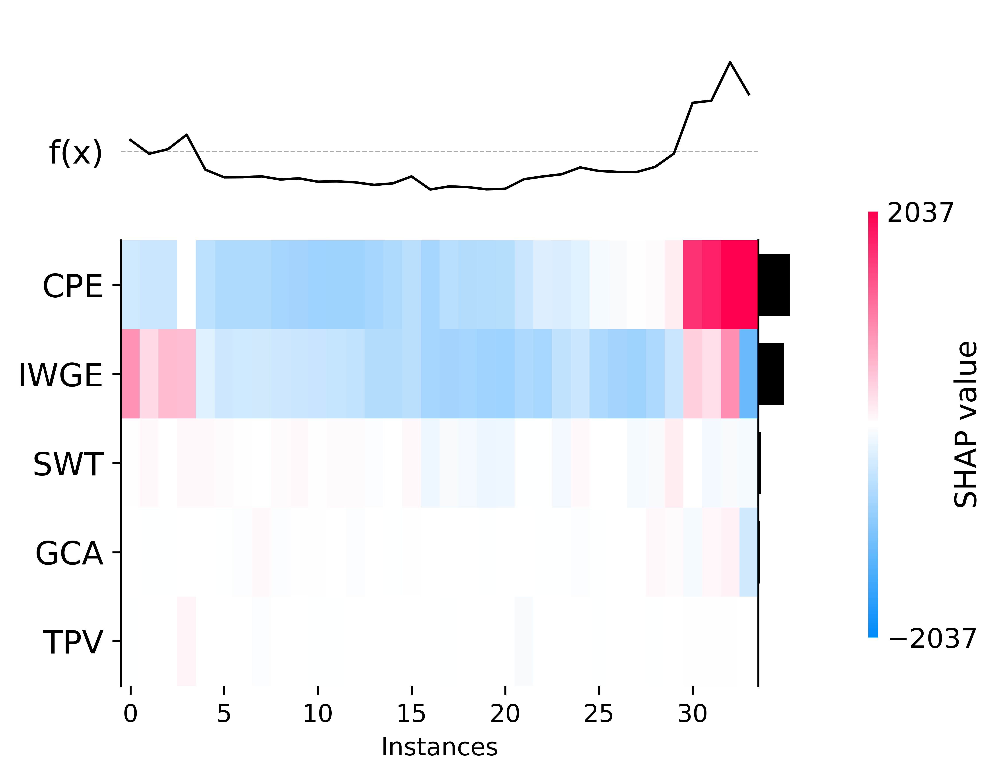

In [28]:
# [宏观]样本聚类下特征分布热力图
shap_values = explainer(x_test)
shap.plots.heatmap(shap_values)

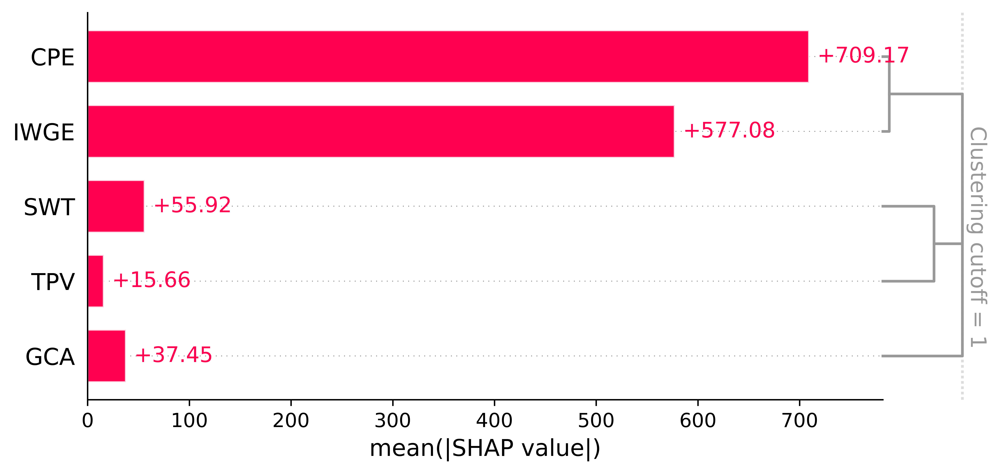

In [29]:
# 层次聚类 + SHAP值
clust = shap.utils.hclust(x_test, y_test)
shap.plots.bar(shap_values, clustering=clust, clustering_cutoff=1)

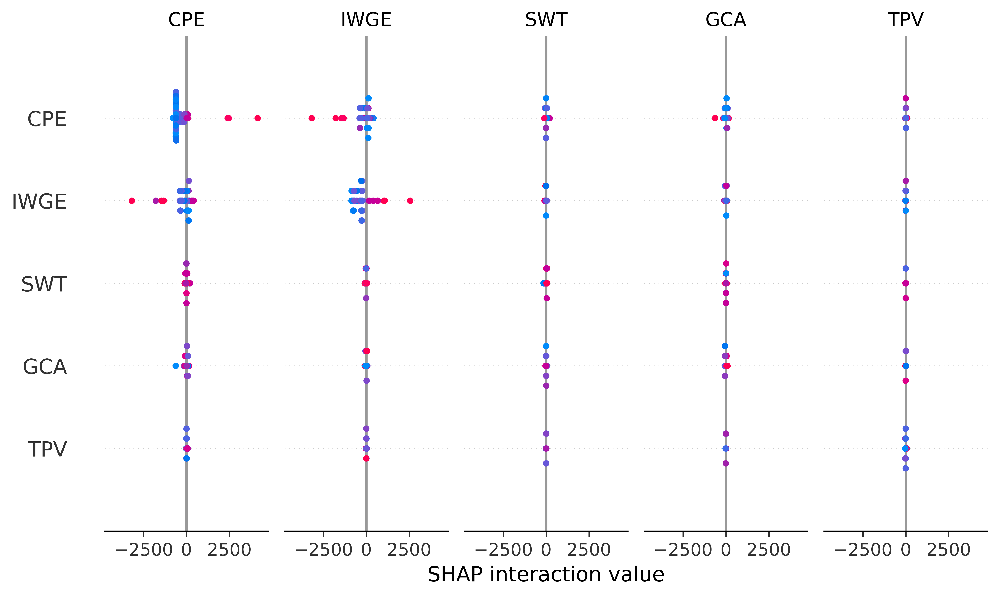

In [30]:
# 交互图
shap.summary_plot(explainer.shap_interaction_values(x_test), x_test, show = False,max_display=9)

In [31]:
# 特征依赖图
shap.plots.scatter(shap_values[:,"Carbon emissions, population size and economic development"],color=shap_values[:,"Industrial waste gas emissions"], show = False)

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [ ]:
# 特征依赖图
shap.plots.scatter(shap_values[:,"Solid waste treatment and Urbanization"],color=shap_values[:,"Passenger traffic"], show = False)

# Stacking模型融合

In [ ]:
# Stacking模型融合
from mlxtend.regressor import StackingRegressor
SR = StackingRegressor(regressors=[model_KNN,model_RF,model_XGB],                      
                       meta_regressor=model_RF)

In [ ]:
# 输出Stacking模型融合后评价指标
print('Stacking模型融合评分如下：')
try_different_method(SR)

In [ ]:
# Stacking模型融合后预测结果可视化
y_predict8 = SR.predict(x_test)
plt.figure(figsize = (12,8))
plt.plot(y_predict8,color = 'b',marker='o',label = 'predict')
plt.plot(y_test,color = 'r',marker='o',label = 'true')
plt.xlabel('sample',fontsize=20)
plt.ylabel('Predictive variable',fontsize=20)
plt.title('Stacking',fontsize=20)
#坐标轴字体大小
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

# 五折交叉验证

In [ ]:
# R2
from sklearn.model_selection import cross_val_score
models = []
models.append(model_KNN)
models.append(model_RF)
models.append(model_XGB)
cv_r2 = []
for model in models :
    cv_r2.append(cross_val_score(model, x, y, scoring = "r2", cv = 5, n_jobs=-1))
cv_all_r2 = pd.DataFrame(columns=["KNN","RF","XGB"])
c=0
for cv_result in cv_r2:
    cv_all_r2.iloc[:,c]=cv_result
    c=c+1
# 交叉验证平均R2
cv_means = []
for cv_result in cv_r2:
    cv_means.append(cv_result.mean())
r2_means = pd.DataFrame({"r2_Means":cv_means,"Model":["KNN","RF","XGB"]})
r2_means  

In [ ]:
# MAE
cv_mae = []
for model in models :
    cv_mae.append(-cross_val_score(model, x, y, scoring = "neg_mean_absolute_error", cv = 5, n_jobs=-1))
cv_all_mae = pd.DataFrame(columns=["KNN","RF","XGB"])
c=0
for cv_result in cv_mae:
    cv_all_mae.iloc[:,c]=cv_result
    c=c+1
# 交叉验证平均mae
cv_means = []
for cv_result in cv_mae:
    cv_means.append(cv_result.mean())
mae_means = pd.DataFrame({"mae_Means":cv_means,"Model":["KNN","RF","XGB"]})
mae_means

In [ ]:
# RMSE
import math
cv_mse = []
for model in models :
    cv_mse.append(-cross_val_score(model, x, y, scoring = "neg_mean_squared_error", cv = 5, n_jobs=-1))
cv_all_mse = pd.DataFrame(columns=["KNN","RF","XGB"])
c=0
for cv_result in cv_mse:
    cv_all_mse.iloc[:,c]=cv_result
    c=c+1
# 交叉验证平均rmse
cv_means = []
for cv_result in cv_mse:
    cv_means.append(math.sqrt(cv_result.mean()))
rmse_means = pd.DataFrame({"rmse_Means":cv_means,"Model":["KNN","RF","XGB"]})
rmse_means

In [ ]:
# 随机划分训练集和测试集,8:2
from sklearn import model_selection
x_train, x_test, y_train, y_test = model_selection.train_test_split(x,y,test_size=0.2,random_state=2022)

In [ ]:
y_test = y_test.reset_index(drop = True)
y_predict1 = model_KNN.predict(x_test)

In [ ]:
df3=pd.DataFrame(y_predict1)

In [ ]:
df=y_test.to_csv('C:/Users/xuchen/Desktop/ytest4.csv')

In [ ]:
df2=df3.to_csv('C:/Users/xuchen/Desktop/ypredit4.csv')

In [ ]:
y_test

In [ ]:
y_predict1

In [ ]:
# 定义评价指标
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error 
from sklearn import metrics
def try_different_method(model):  
    model.fit(x_train,y_train)
    y_predict = model.predict(x_test) 
   
    print('RMSE值为:',np.sqrt(metrics.mean_squared_error(y_test, y_predict)))
    print('MAE值为:',mean_absolute_error(y_test,y_predict))
    print('R方值为:', metrics.r2_score(y_test, y_predict))
    # 输出测试集评价指标
print('KNN模型评分如下：')
try_different_method(model_KNN)
# print('随机森林模型评分如下：')
# try_different_method(model_RF)
# print('XGboost模型评分如下：')
# try_different_method(model_XGB)

In [ ]:
# # 模型建立
# from sklearn.neighbors import KNeighborsRegressor
# from sklearn.ensemble import RandomForestRegressor
# import xgboost as xgb




model_KNN = KNeighborsRegressor(n_neighbors=5)
# model_RF = RandomForestRegressor(random_state=2022,
#                                          n_estimators=50,
#                                             max_depth=2)
# model_XGB = xgb.XGBRegressor(max_depth=4,
#                              learning_rate=0.3, 
#                             n_estimators=50,
#                             random_state=2022)